In [1]:
import warnings
warnings.filterwarnings('ignore')

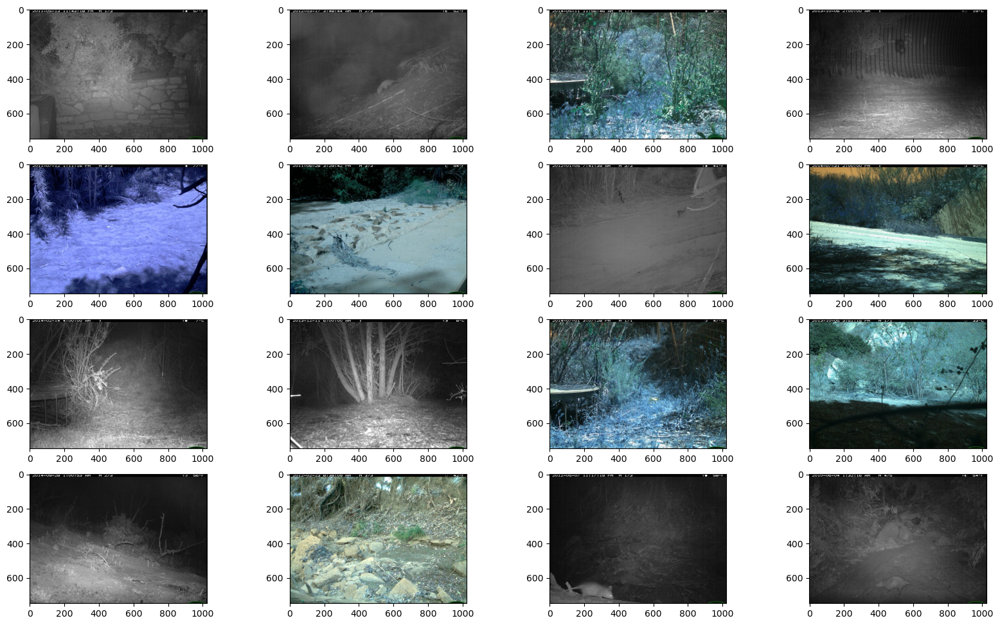

In [2]:
%run src\pre_transformer.py

In [3]:
%run src\call_transformer.py

(196299, 32, 32, 3)
(153730, 32, 32, 3)
(196299, 14)
Saving content/transformed_data_clahe/Resized_xTrain.npy
Saving content/transformed_data_clahe/Resized_yTrain.npy
Saving content/transformed_data_clahe/Resized_xTest.npy
Total time taken for transforming images is 8444.294172525406 seconds


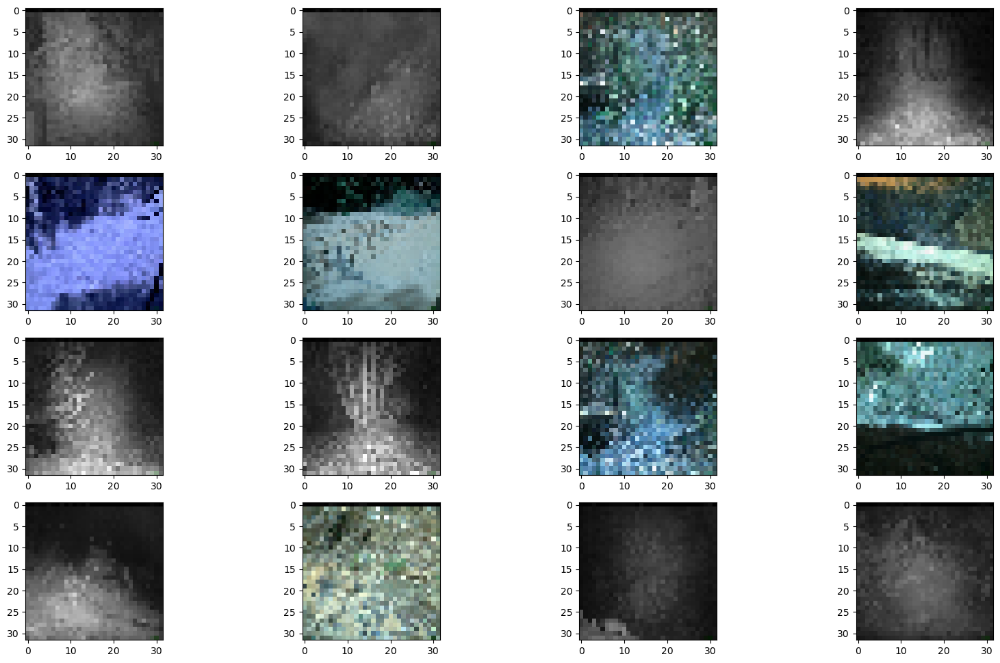

In [4]:
%run src\post_transformer.py

# Model implementation

In [1]:
import sys
import numpy as np
import tensorflow.keras
import pandas as pd
import sklearn as sk
import tensorflow as tf
import glob
import os
import json
print("GPU is", "available" if tf.test.is_gpu_available() else "NOT AVAILABLE")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU is available


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
from src.pre_modelling import load_and_preprocess_data
from src.metrics import F1PR_History
from src.constants import *

X_train, X_val, y_train, y_val = load_and_preprocess_data()
f1_metrics = F1PR_History((X_val,y_val))

In [4]:
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((176669, 32, 32, 3), (19630, 32, 32, 3), (176669, 14), (19630, 14))

## Resnet

In [9]:
from src.model_final import train_model
resnet101, history_resnet101 = train_model("resnet",X_train, y_train, X_val, y_val, f1_metrics)

Model: "resnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 1, 1, 2048)        42658176  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 14)                28686     
                                                                 
Total params: 42,686,862
Trainable params: 42,581,518
Non-trainable params: 105,344
_________________________________________________________________
Epoch 1/10
614/614 [==============================] - 9s 14ms/step
val_f1: 0.0418 — val_precision: 0.0515 — val_recall: 0.0572

Epoch 1: val_accuracy improved from -inf to 0.32527, saving model to model_resnet_20240503185252.h5
2761/2761 [=

In [5]:
def load_best_model(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"model_{model_name}_*.h5")
    model_files = glob.glob(pattern)

    if not model_files:
        print(f"No model found with name '{model_name}'")
        return None
    latest_model_file = max(model_files, key=os.path.getmtime)
    
    model = tf.keras.models.load_model(latest_model_file)
    print(f"Loaded best model '{latest_model_file}'")
    
    return model
resnet101 = load_best_model("resnet")

def load_json_file(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"history_{model_name}.json")
    with open(pattern, 'r') as file:
        data = json.load(file)
        return data
history_resnet101 = load_json_file("resnet")

Loaded best model 'C:\Users\susha\Documents\Workspace\ML_project\species_detection_python\model_resnet_20240503185252.h5'


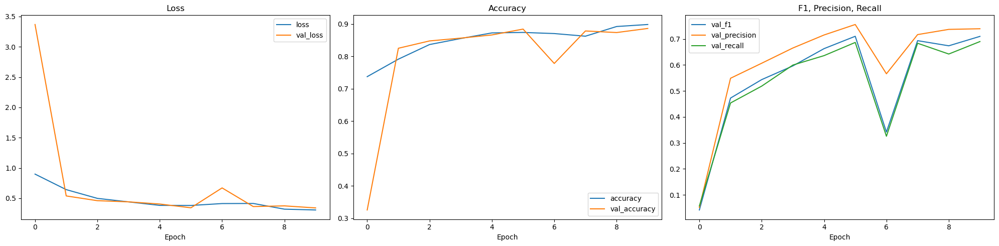

Resnet Model Performance:
Training Loss: 0.3067280650138855
Validation Loss: 0.34063729643821716
Training Accuracy: 0.8979900479316711
Validation Accuracy: 0.8857870697975159
Validation F1 Score: 0.7098082793611739
Validation Precision: 0.7391951227836365
Validation Recall: 0.6899096786692807


In [6]:
from src.save_and_plot import save_and_plot
save_and_plot(history_resnet101,"resnet")

614/614 [==============================] - 15s 15ms/step


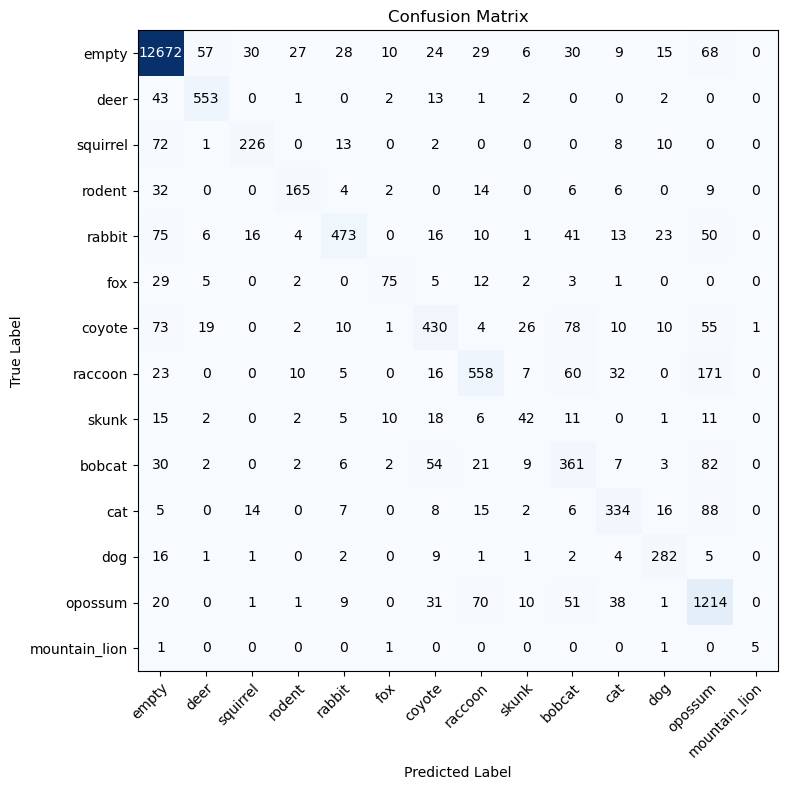

In [7]:
from src.get_confusion_matrix import get_confusion_matrix
get_confusion_matrix(resnet101, X_val, y_val)

## Densenet

In [18]:
from src.model_final import train_model
densenet121, history_densenet121 = train_model("densenet",X_train, y_train, X_val, y_val, f1_metrics)

Model: "densenet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 1, 1, 1024)        7037504   
                                                                 
 global_average_pooling2d_3   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_3 (Dense)             (None, 14)                14350     
                                                                 
Total params: 7,051,854
Trainable params: 6,968,206
Non-trainable params: 83,648
_________________________________________________________________
Epoch 1/10
614/614 [==============================] - 8s 12ms/step
val_f1: 0.3805 — val_precision: 0.5195 — val_recall: 0.3575

Epoch 1: val_accuracy improved from -inf to 0.79628, saving model to model_densenet_20240503192629.h5
2761/2761 [

In [8]:
def load_best_model(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"model_{model_name}_*.h5")
    model_files = glob.glob(pattern)

    if not model_files:
        print(f"No model found with name '{model_name}'")
        return None
    latest_model_file = max(model_files, key=os.path.getmtime)
    
    model = tf.keras.models.load_model(latest_model_file)
    print(f"Loaded best model '{latest_model_file}'")
    
    return model
densenet121 = load_best_model("densenet")

def load_json_file(model_name):
    model_dir = os.getcwd()
    pattern = os.path.join(model_dir, f"history_{model_name}.json")
    with open(pattern, 'r') as file:
        data = json.load(file)
        return data
history_densenet121 = load_json_file("densenet")

Loaded best model 'C:\Users\susha\Documents\Workspace\ML_project\species_detection_python\model_densenet_20240503192629.h5'


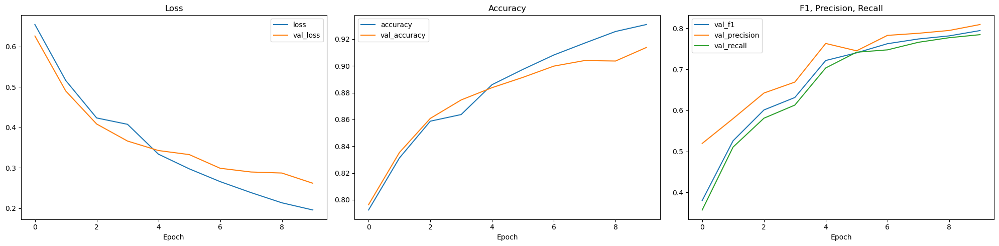

Densenet Model Performance:
Training Loss: 0.19544009864330292
Validation Loss: 0.2616492211818695
Training Accuracy: 0.9309499859809875
Validation Accuracy: 0.9138054251670837
Validation F1 Score: 0.7943793153672242
Validation Precision: 0.8091092649239995
Validation Recall: 0.7843914977907894


In [9]:
from src.save_and_plot import save_and_plot
save_and_plot(history_densenet121,"densenet")

614/614 [==============================] - 9s 13ms/step


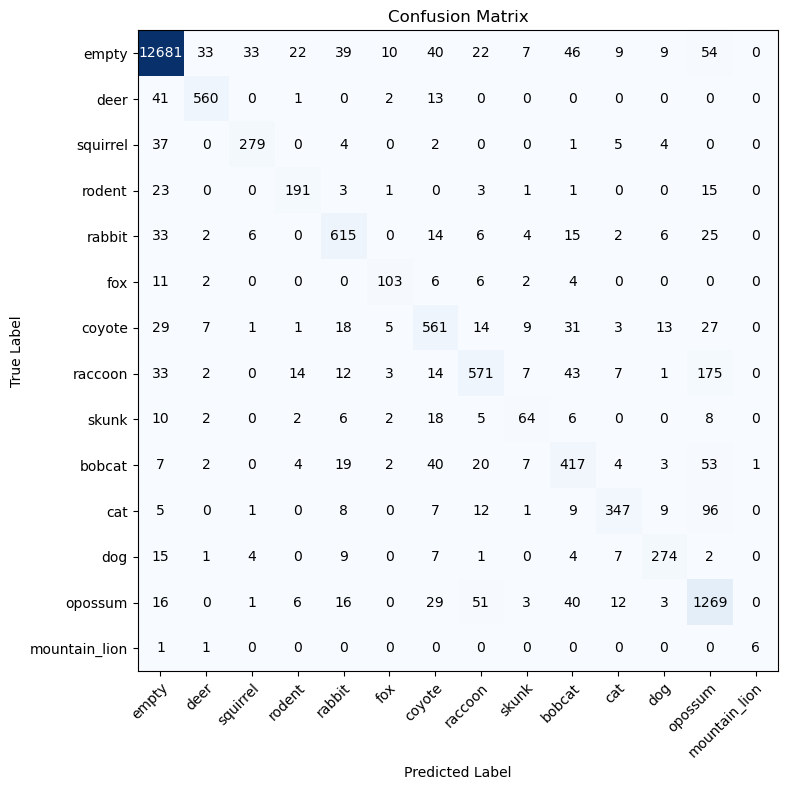

In [10]:
from src.get_confusion_matrix import get_confusion_matrix
get_confusion_matrix(densenet121,X_val, y_val)

### Predicting test images

In [11]:
BASE_DIR = os.path.join(os.getcwd(), "content","transformed_data1")

In [12]:
def load_and_preprocess_test_data():
    x_test_path = os.path.join(BASE_DIR, "Resized_xTest.npy")
    image_array = np.load(x_test_path)
    image_array = image_array.astype('float32')
    image_array /= 255.
    return image_array

test_image_array = load_and_preprocess_test_data()

In [13]:
import matplotlib.pyplot as plt
import cv2
import pandas as pd

TRAIN_FILE_PATH = os.path.join(os.getcwd(), "content","transformed_content","sample_submission.csv")

def plot_images(train_df, cols, rows, titles=None):
    figure = plt.figure(figsize=(5 * cols, 3 * rows))
    for i in range(cols * rows):
        image_path = train_df.loc[i, 'Id']
        image = cv2.imread(f'content/transformed_content/test_images/{image_path}.jpg')
        ax = figure.add_subplot(rows, cols, i + 1)
        if(image is not None):
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        if titles:
            ax.set_title(titles[i])

    plt.tight_layout()
    plt.show()

In [14]:
dummies_to_label = {'0': 0, '1': 1, '2': 3, '3': 4, '4': 8, '5': 10, '6': 11, '7': 13, '8': 14, '9': 16,
                    '10': 17, '11': 18, '12': 19, '13': 22}

label_to_animal = {0: 'empty', 1: 'deer', 3: 'squirrel', 4: 'rodent', 8: 'rabbit', 10: 'fox', 11: 'coyote',
                   13: 'raccoon', 14: 'skunk', 16: 'bobcat', 17: 'cat', 18: 'dog', 19: 'opossum',
                   22: 'mountain_lion'}

### Resnet prediction

In [15]:
# Predict using the loaded model
result = resnet101.predict(test_image_array)
predictions = result.argmax(axis=1)

4805/4805 [==============================] - 70s 15ms/step


In [16]:
predictions[:16]

array([0, 6, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 6, 0, 0, 5], dtype=int64)

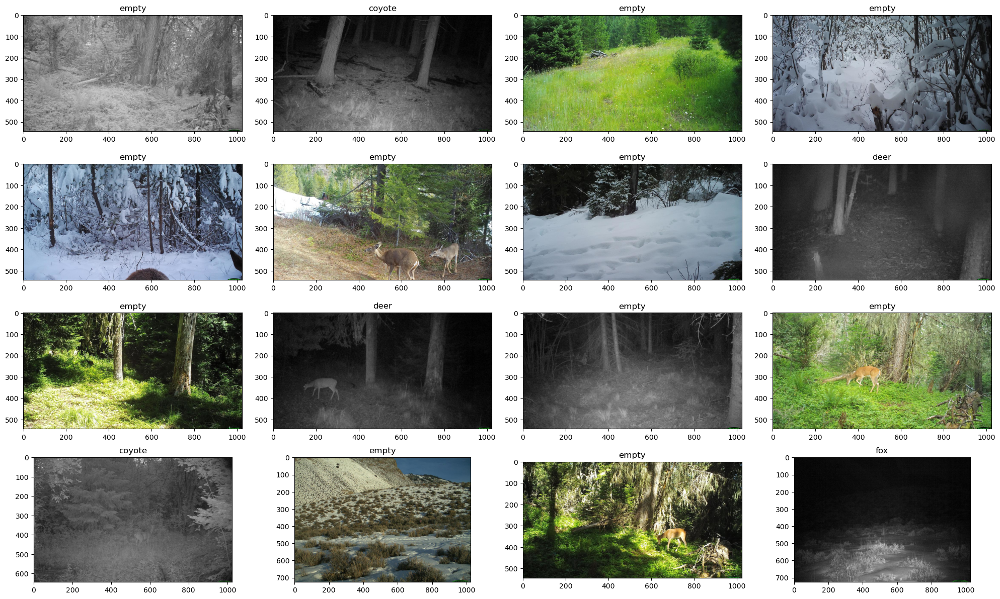

In [17]:
titles =[i for i in result.argmax(axis=1)]
titles = [dummies_to_label[str(i)]for i in titles]
titles = [label_to_animal[i] for i in titles]

train_df = pd.read_csv(TRAIN_FILE_PATH)
plot_images(train_df, 4, 4, titles)

### Densenet prediction

In [18]:
result = densenet121.predict(test_image_array)

4805/4805 [==============================] - 62s 13ms/step


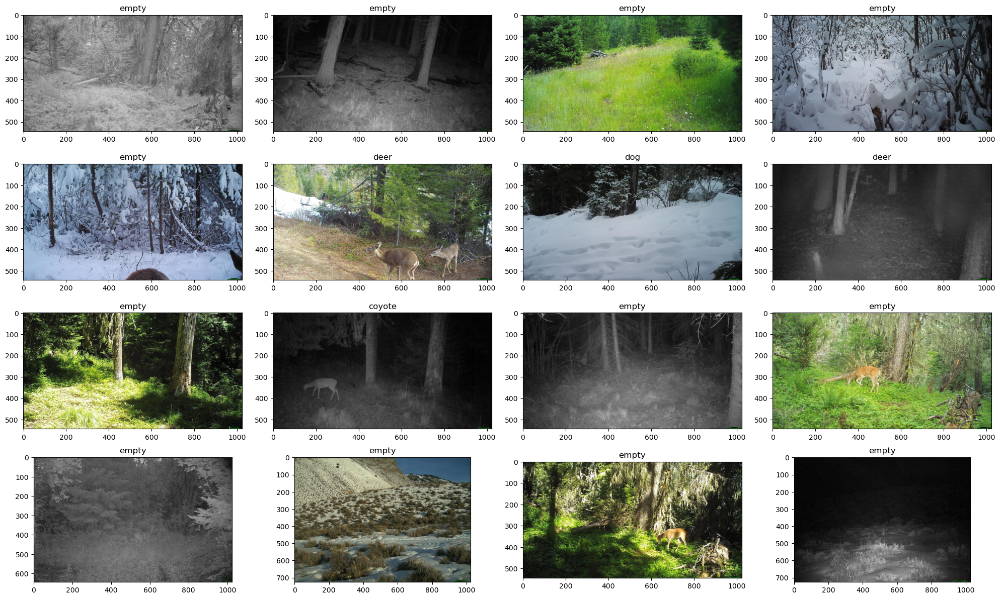

In [19]:
titles =[i for i in result.argmax(axis=1)]
titles = [dummies_to_label[str(i)]for i in titles]
titles = [label_to_animal[i] for i in titles]

train_df = pd.read_csv(TRAIN_FILE_PATH)
plot_images(train_df, 4, 4, titles)